<a href="https://colab.research.google.com/github/Soosan-Shabnam/data_science/blob/main/ImagePreprocessing2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Downloads and Imports

In [ ]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
!pip install pytesseract
!sudo apt install tesseract-ocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.1 MB 35.8 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 20 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 1s (5,206 kB/s)
debconf: unable to initi

In [ ]:
import pytesseract as pt
import re

In [ ]:
import imutils

# Image Preprocessing

In [ ]:
img = cv2.imread("/content/test4.jpg")
original = img.copy()

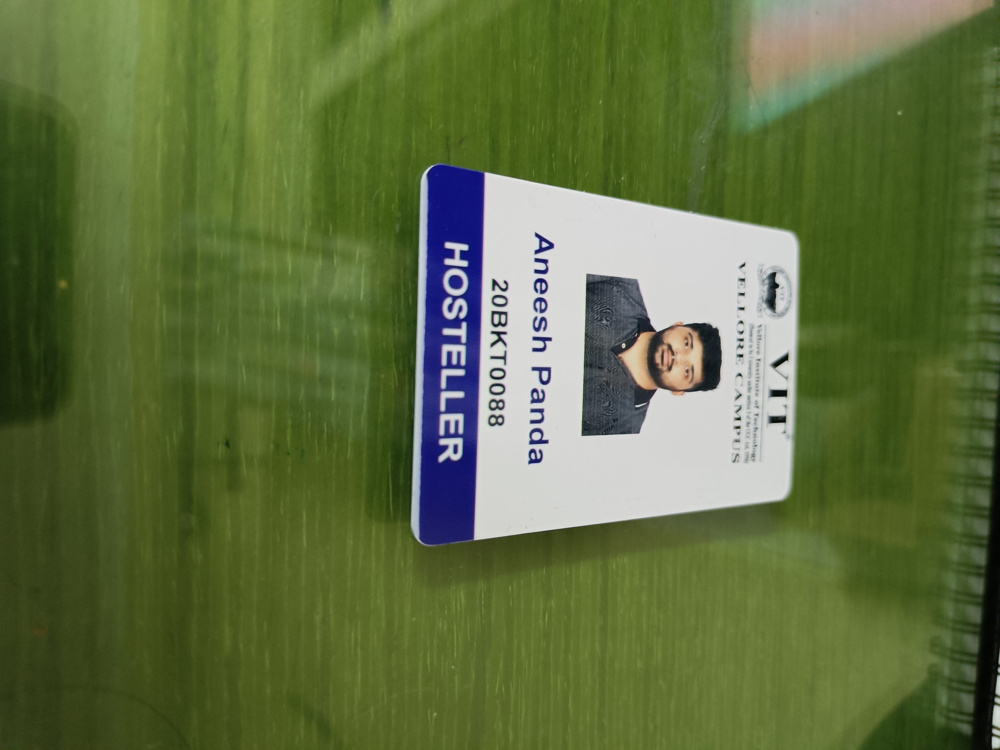

In [ ]:
cv2_imshow(img)

In [ ]:
blur = cv2.GaussianBlur(img,(201, 201),0)

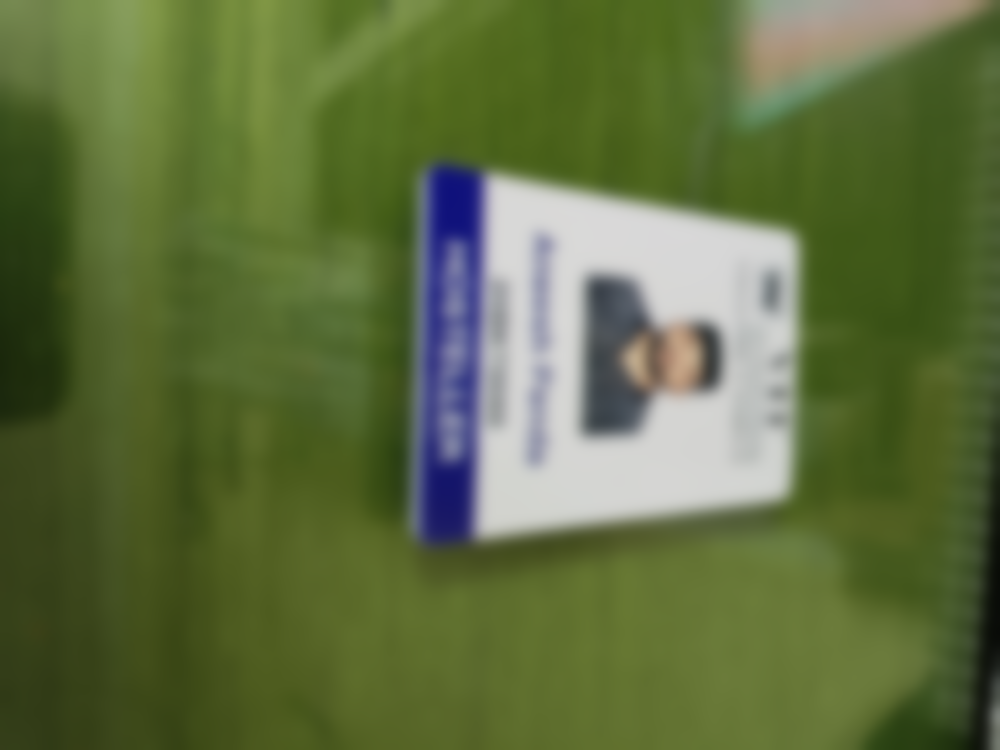

In [ ]:
cv2_imshow(blur)

In [ ]:
gray = cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)

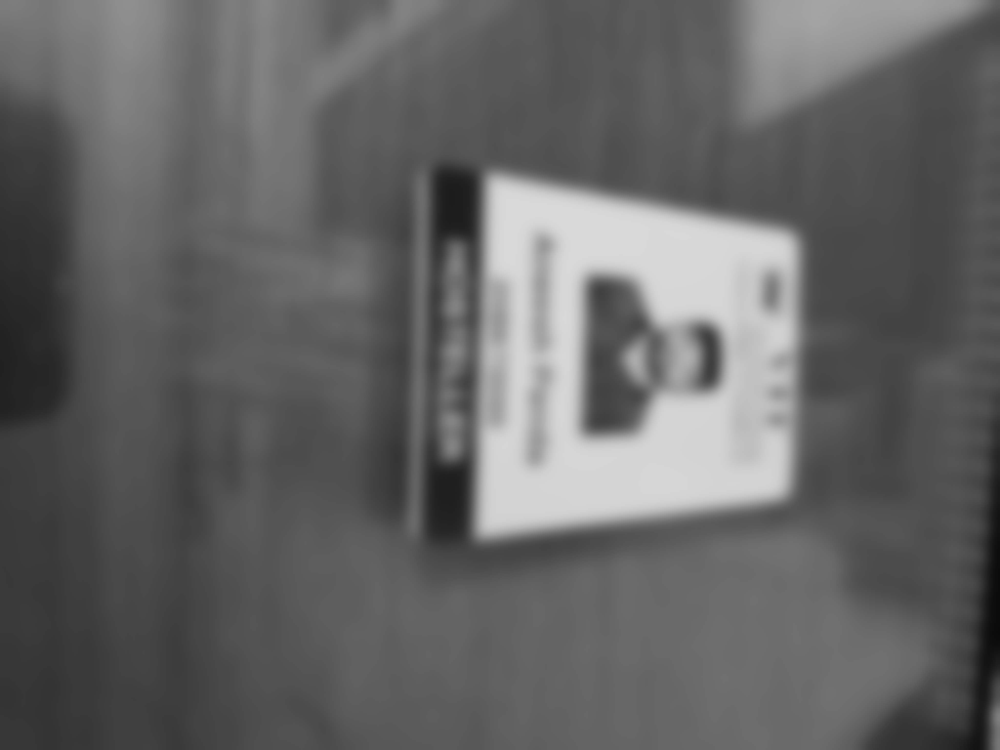

In [ ]:
cv2_imshow(gray)

In [ ]:
thresh = 128
maxValue = 255

thresh, im_bw = cv2.threshold(gray, thresh, maxValue, cv2.THRESH_BINARY);

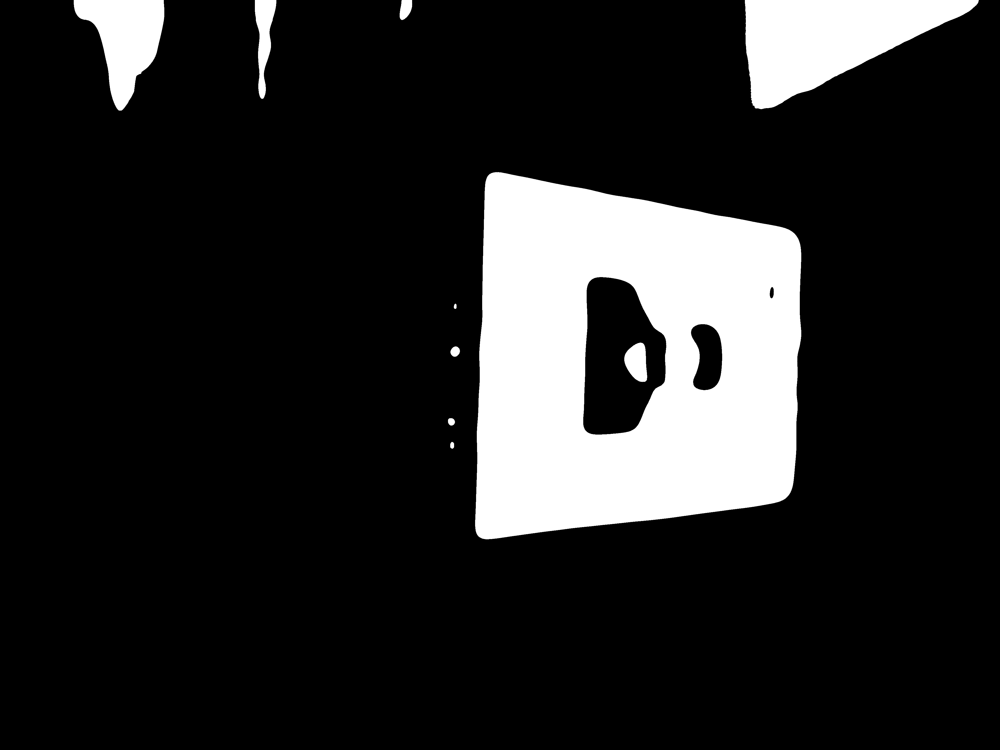

In [ ]:
cv2_imshow(im_bw)

In [ ]:
contours, hierarchy = cv2.findContours(im_bw, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [ ]:
def CardContour():
  eligible_contours = {}
  highest_val = []

  for i in hierarchy[0]:
    if i[3] in eligible_contours:
      eligible_contours[i[3]] += 1

    elif i[3] != -1:
      eligible_contours.update({i[3]: 1})

  print(eligible_contours)

  sorted_vals = sorted(list(eligible_contours.values()))
  highest_val.append(sorted_vals[-1])

  for i in reversed(range(1, len(sorted_vals))):
    if sorted_vals[i] == sorted_vals[-1]: highest_val.append(sorted_vals[i])

    else: break

  for i in list(eligible_contours.keys()):
    if eligible_contours[i] == highest_val[0]:
      return i


In [ ]:
def SquareContour(i):
      flag = 0.01

      while True:
        epsilon = flag * cv2.arcLength(contours[i], True)
        approximations = cv2.approxPolyDP(contours[i], epsilon, True)

        if(len(approximations)) > 4: flag += 0.01

        elif(len(approximations)) == 4: return approximations


In [ ]:
CardContour()

{4: 3, 7: 1}


4

In [ ]:
#cv2.drawContours(original, [SquareContour(CardContour())], 0, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

In [ ]:
x,y,w,h = cv2.boundingRect(SquareContour(CardContour()))
#cv2.rectangle(original, (x, y), (x + w, y + h), (255,0,0), 4)

{4: 3, 7: 1}


In [ ]:
#cv2_imshow(original)

In [ ]:
crop = original[y : y + h, x : x + w]

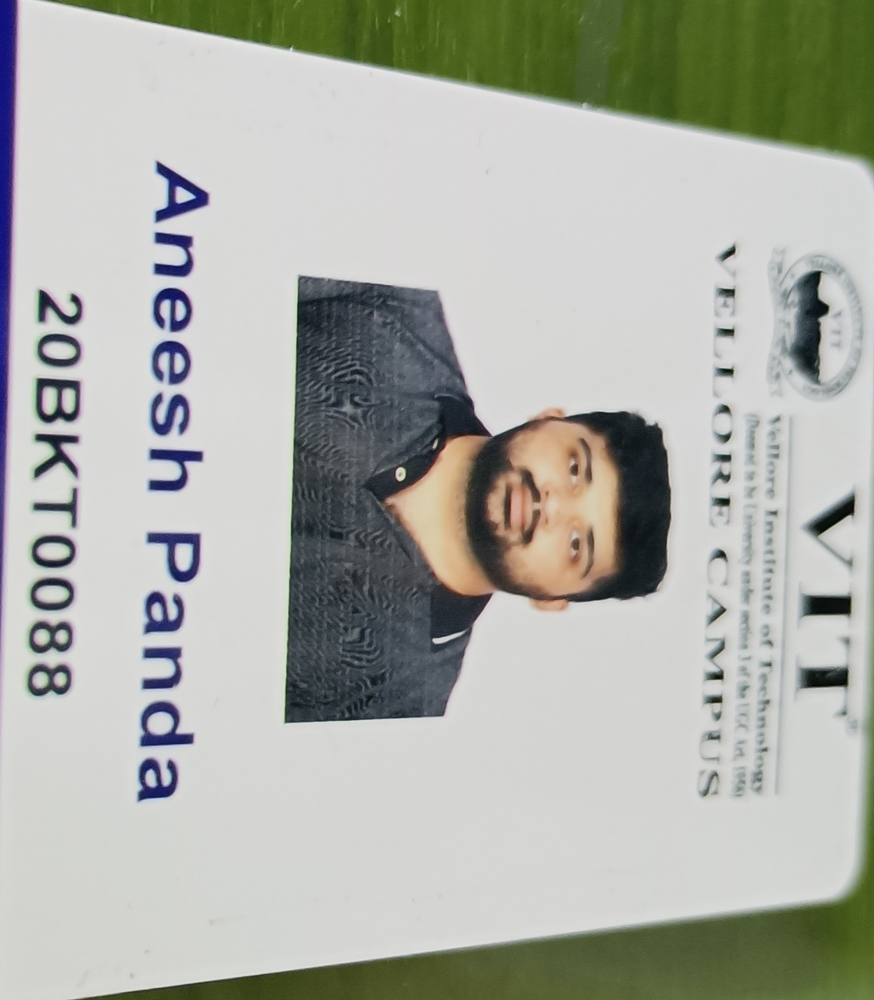

In [ ]:
cv2_imshow(crop)

In [ ]:

from math import atan2, cos, sin, sqrt, pi
 
def drawAxis(img, p_, q_, color, scale):
  p = list(p_)
  q = list(q_)
 
  angle = atan2(p[1] - q[1], p[0] - q[0]) # angle in radians
  hypotenuse = sqrt((p[1] - q[1]) * (p[1] - q[1]) + (p[0] - q[0]) * (p[0] - q[0]))
 
 
  q[0] = p[0] - scale * hypotenuse * cos(angle)
  q[1] = p[1] - scale * hypotenuse * sin(angle)
  cv2.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv2.LINE_AA)
 
  
  p[0] = q[0] + 9 * cos(angle + pi / 4)
  p[1] = q[1] + 9 * sin(angle + pi / 4)
  cv2.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv2.LINE_AA)
 
  p[0] = q[0] + 9 * cos(angle - pi / 4)
  p[1] = q[1] + 9 * sin(angle - pi / 4)
  cv2.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv2.LINE_AA)
  
 
def getOrientation(pts, img):
  ## [pca]
  # Construct a buffer used by the pca analysis
  sz = len(pts)
  data_pts = np.empty((sz, 2), dtype=np.float64)
  for i in range(data_pts.shape[0]):
    data_pts[i,0] = pts[i,0,0]
    data_pts[i,1] = pts[i,0,1]
 
  # Perform PCA analysis
  mean = np.empty((0))
  mean, eigenvectors, eigenvalues = cv2.PCACompute2(data_pts, mean)
 
  # Store the center of the object
  cntr = (int(mean[0,0]), int(mean[0,1]))
  ## [pca]
 
  ## [visualization]
  # Draw the principal components
  cv2.circle(img, cntr, 3, (255, 0, 255), 2)
  p1 = (cntr[0] + 0.02 * eigenvectors[0,0] * eigenvalues[0,0], cntr[1] + 0.02 * eigenvectors[0,1] * eigenvalues[0,0])
  p2 = (cntr[0] - 0.02 * eigenvectors[1,0] * eigenvalues[1,0], cntr[1] - 0.02 * eigenvectors[1,1] * eigenvalues[1,0])
  drawAxis(img, cntr, p1, (255, 255, 0), 1)
  drawAxis(img, cntr, p2, (0, 0, 255), 5)
 
  angle = atan2(eigenvectors[0,1], eigenvectors[0,0]) # orientation in radians
  ## [visualization]
 
  
  label = "  Rotation Angle: " + str(-int(np.rad2deg(angle)) - 90) + " degrees"
  textbox = cv2.rectangle(img, (cntr[0], cntr[1]-25), (cntr[0] + 250, cntr[1] + 10), (255,255,255), -1)
  cv2.putText(img, label, (cntr[0], cntr[1]), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1, cv2.LINE_AA)
 
  return angle
 



In [ ]:
# Find the orientation of card
obj_rot=str(-int(np.rad2deg(getOrientation(contours[CardContour()], original))) - 90)



{4: 3, 7: 1}


In [ ]:
rotated = imutils.rotate_bound(crop, int(obj_rot))

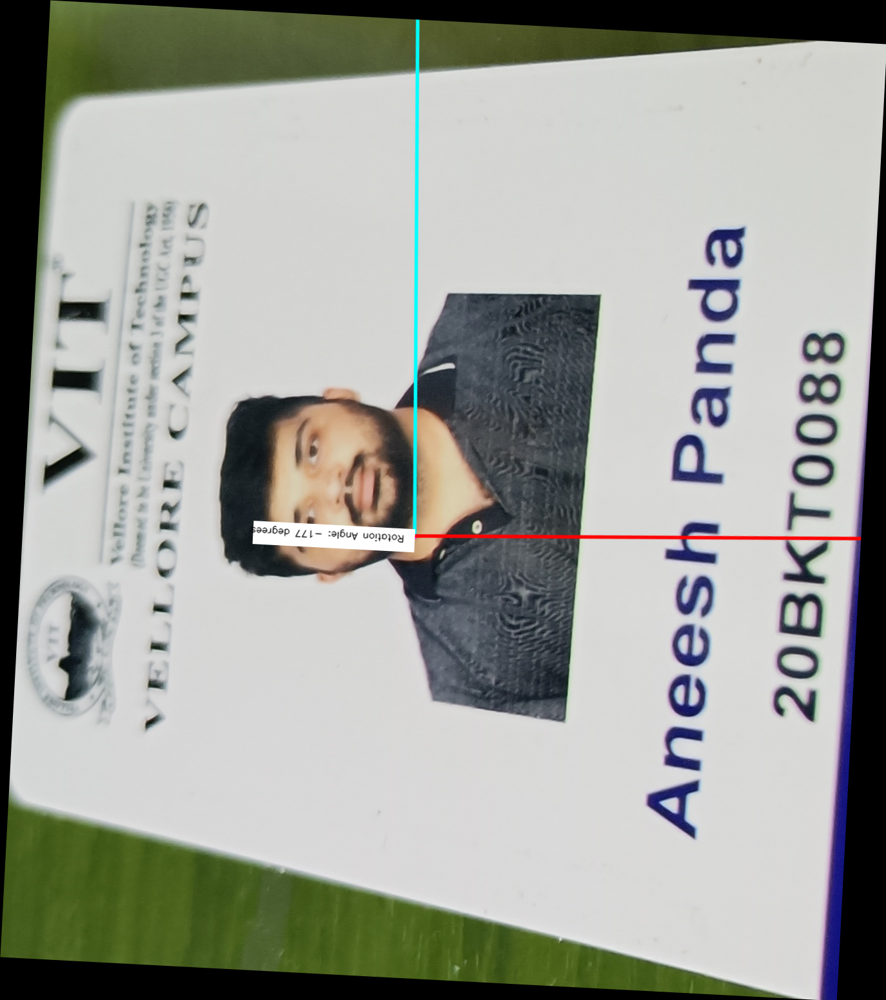

In [ ]:
cv2_imshow(rotated)

In [ ]:
crop_gs = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)

In [ ]:
pt.image_to_string(crop_gs)

"   \n\n' - s Viere Vreetttuee of Techwnate.\n\n™\nVELLORE Cc AMPIis\n\n     \n\n \n\nAneesh Panda\n20BK\\TO088\n\x0c"